# Data setup

In [1]:
%tensorflow_version 2.x

TensorFlow 2.x selected.


In [2]:
import tensorflow as tf
import numpy as np
import zipfile
import cv2
import os
import pdb
import random
import logging
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')
drive_path = '/content/drive/My Drive/Dataset/'
data_path = '/content/'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [0]:
with zipfile.ZipFile(drive_path + 'test_images.zip', 'r') as zip_ref:
    zip_ref.extractall(data_path)

# Generator

In [0]:
class Generator(tf.keras.Model):
  def __init__(self):
    super(Generator, self).__init__()
    self.pool = tf.keras.layers.MaxPool2D( (2, 2), strides=(2, 2), padding='same', input_shape=(320, 180, 1))
    # self.upsample3by2 = tf.keras.layers.UpSampling2D((3, 2))
    self.upsample2by2 = tf.keras.layers.UpSampling2D((2, 2))
    self.conv1_1 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding=[[0, 0], [1, 1], [1, 1], [0, 0]])
    self.conv1_2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding=[[0, 0], [1, 1], [1, 1], [0, 0]] )
    self.conv2_1 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding=[[0, 0], [1, 1], [1, 1], [0, 0]] )
    self.conv2_2 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding=[[0, 0], [1, 1], [1, 1], [0, 0]] )
    self.conv3_1 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding=[[0, 0], [1, 1], [1, 2], [0, 0]] )
    self.conv3_2 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding=[[0, 0], [1, 1], [1, 2], [0, 0]])
    self.conv4 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same' )
    self.conv5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same' )

    self.combconv11 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same' )
    self.combconv12 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same' )
    self.combconv21 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same' )
    self.combconv22 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same' )
    self.combconv31 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same' )
    self.combconv32 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same' )
    
    self.transconv1 = tf.keras.layers.Conv2DTranspose(128, (2, 2), activation='relu', padding='same')
    self.transconv2 = tf.keras.layers.Conv2DTranspose(64, (2, 2), activation='relu', padding='same')
    self.transconv3 = tf.keras.layers.Conv2DTranspose(64, (2, 2), activation='relu', padding='same')

    self.finalconv1 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')
    self.finalconv2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')

    self.finalconv3 = tf.keras.layers.Conv2D(1, (1, 1), activation='relu', padding='same')

  def call(self, x):
    #x = tf.dtypes.cast(x, tf.dtypes.float32)
    conv11out = self.conv1_1(x)
    conv12out = self.conv1_2(x)
    pool1out = self.pool(conv11out)
    conv21out = self.conv2_1(pool1out)
    conv22out = self.conv2_2(pool1out)
    pool2out = self.pool(conv21out)
    conv31out = self.conv3_1(pool2out)
    conv32out = self.conv3_2(pool2out)
    pool3out = self.pool(conv31out)
    conv4out = self.conv4(pool3out)
    conv5out = self.conv5(conv4out)

    upsample1out = self.upsample2by2(conv5out)
    c_upsamp1e1out = tf.concat([conv32out, upsample1out], axis=3)
    combout3 = self.combconv31(c_upsamp1e1out)
    combout3 = self.combconv32(combout3)

    transconv1out = self.transconv1(combout3)
    upsample2out = self.upsample2by2(transconv1out)
    c_upsample2out = tf.concat([conv22out, tf.slice(upsample2out, [0, 0, 0, 0], [-1, -1, 90, -1])], axis=3)
    combout2 = self.combconv21(c_upsample2out)
    combout2 = self.combconv22(combout2)

    transconv2out = self.transconv2(combout2)
    upsample3out = self.upsample2by2(transconv2out)
    c_upsample3out = tf.concat([conv12out, upsample3out], axis=3)
    combout1 = self.combconv11(c_upsample3out)
    combout1 = self.combconv12(combout1)
    
    transconv3 = self.transconv3(combout1)

    finalconv = self.finalconv1(transconv3)
    finalconv = self.finalconv2(finalconv)
    finalconv = self.finalconv3(finalconv)
    return finalconv


# generator = Generator()(first_batch_x)
# print(generator.shape)

# Discriminator

In [0]:
class Discriminator(tf.keras.Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        # Input: batch x 640 x 360 x 3
        self.flatten = tf.keras.layers.Flatten()
        self.leakyrelu = tf.keras.layers.LeakyReLU(0.2)

        self.conv1 = tf.keras.layers.Conv2D(128, (3, 3), strides=1, padding='same', input_shape=(320, 180, 1))
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.conv2 = tf.keras.layers.Conv2D(128, (3, 3), strides=1, padding='same')
        self.bn2 = tf.keras.layers.BatchNormalization()
        self.maxpool1 = tf.keras.layers.MaxPool2D((2, 2), strides=2)

        self.conv3 = tf.keras.layers.Conv2D(256, (3, 3), strides=1, padding='same')
        
        self.conv4 = tf.keras.layers.Conv2D(256, (3, 3), strides=1, padding='same')
        self.bn3 = tf.keras.layers.BatchNormalization()
        self.maxpool2 = tf.keras.layers.MaxPool2D((2, 2), strides=2)

        self.conv5 = tf.keras.layers.Conv2D(512, (3, 3), strides=1, padding='same')
        self.bn4 = tf.keras.layers.BatchNormalization()
        self.conv6 = tf.keras.layers.Conv2D(512, (3, 3), strides=1, padding='same')

        self.conv7 = tf.keras.layers.Conv2D(512, (3, 3), strides=2, padding='same')

        self.fcl1 = tf.keras.layers.Dense(1024)
        self.fcl2 = tf.keras.layers.Dense(512)
        self.out = tf.keras.layers.Dense(1)

    def call(self, inputs):
        l1 = self.conv1(inputs)
        l1 = self.bn1(l1)
        l1 = self.leakyrelu(l1)
        
        l2 = self.conv2(l1)
        l2 = self.bn2(l2)
        l2 = self.leakyrelu(l2)
        l2 = self.maxpool1(l2)

        l3 = self.conv3(l2)
        l3 = self.leakyrelu(l3)

        l4 = self.conv4(l3)
        l4 = self.bn3(l4)
        l4 = self.leakyrelu(l4)
        l4 = self.maxpool2(l4)

        l5 = self.conv5(l4)
        l5 = self.bn4(l5)
        l5 = self.leakyrelu(l5)

        l6 = self.conv6(l5)
        l6 = self.leakyrelu(l6)

        l7 = self.conv7(l6)
        l7 = self.leakyrelu(l7)

        l8 = self.flatten(l7)
        l8 = self.fcl1(l8)
        l8 = self.leakyrelu(l8)

        l8 = self.fcl2(l7)
        l8 = self.leakyrelu(l8)

        return self.out(l8) 

# Output Images

In [0]:
def show_test_examples(static_images, real_instances, l1_generated_instances, gan_generated_instances, num=1):
  i = 0
  while i < num and i < real_instances.shape[0]:

    static = static_images[i].astype(int)
    static = np.moveaxis(static, 0, 1)
    plt.imshow(static.squeeze(), cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.show()

    original = real_instances[i].astype(int)
    original = np.moveaxis(original, 0, 1)
    plt.imshow(original.squeeze(), cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.show()

    l1_generated_instance = l1_generated_instances[i]
    if hasattr(l1_generated_instance, 'numpy'):
      l1_generated_instance = l1_generated_instance.numpy()
    l1_prediction = np.rint(l1_generated_instance).astype(int)
    l1_prediction = np.moveaxis(l1_prediction, 0, 1)
    plt.imshow(l1_prediction.squeeze(), cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.show()


    gan_generated_instance = gan_generated_instances[i]
    if hasattr(gan_generated_instance, 'numpy'):
      gan_generated_instance = gan_generated_instance.numpy()
    gan_prediction = np.rint(gan_generated_instance).astype(int)
    gan_prediction = np.moveaxis(gan_prediction, 0, 1)
    plt.imshow(gan_prediction.squeeze(), cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.show()

    i += 1

def show_small_test_examples(real_instances, l1_generated_instances, gan_generated_instances, num=1):
  i = 0
  while i < num and i < real_instances.shape[0]:
    original = real_instances[i].astype(int)
    original = np.moveaxis(original, 0, 1)

    l1_generated_instance = l1_generated_instances[i]
    if hasattr(l1_generated_instance, 'numpy'):
      l1_generated_instance = l1_generated_instance.numpy()
    l1_prediction = np.rint(l1_generated_instance).astype(int)
    l1_prediction = np.moveaxis(l1_prediction, 0, 1)

    gan_generated_instance = gan_generated_instances[i]
    if hasattr(gan_generated_instance, 'numpy'):
      gan_generated_instance = gan_generated_instance.numpy()
    gan_prediction = np.rint(gan_generated_instance).astype(int)
    gan_prediction = np.moveaxis(gan_prediction, 0, 1)
    
    f, axarr = plt.subplots(1, 3, figsize=(15, 15))
    axarr[0].imshow(original.squeeze(), cmap='gray', vmin=0, vmax=255)
    axarr[0].axis('off')
    axarr[1].imshow(l1_prediction.squeeze(), cmap='gray', vmin=0, vmax=255)
    axarr[1].axis('off')
    axarr[2].imshow(gan_prediction.squeeze(), cmap='gray', vmin=0, vmax=255)
    axarr[2].axis('off')
    plt.subplots_adjust(wspace=0.05, hspace=0)
    plt.show()

    i += 1

## Get Test Data

In [0]:
scale = 0.5
img_height = 360
img_width = 640
img_cropped_width = 480
cropped_padding = (img_width - img_cropped_width)/2
img_channels = 1
img_paths = os.listdir(data_path + 'test_images')
img_paths = [img_path for img_path in img_paths if 'jpg' in img_path]
testing_paths = img_paths[:]

output_x_array = np.zeros((len(testing_paths), int(img_cropped_width * scale), int(img_height * scale), 1), dtype=np.float32)
output_y_array = np.zeros((len(testing_paths), int(img_width * scale), int(img_height * scale), 1), dtype=np.float32)
for i in range(len(testing_paths)):
  img = cv2.imread(data_path + 'test_images/' + testing_paths[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img = np.moveaxis(img, 0, 1)
  img = np.float32(img)

  # Taken from https://www.tutorialkart.com/opencv/python/opencv-python-resize-image/
  width = int(img.shape[1] * scale)
  height = int(img.shape[0] * scale)
  # change rgb to greyscale
  dim = (width, height)
  # resize image
  resized = cv2.resize(img, dim , interpolation = cv2.INTER_AREA)
  W =  int(resized.shape[0])
  H = int(resized.shape[1])
  resized = np.expand_dims(resized, axis=2)

  output_x_array[i] = resized[40:280]
  output_y_array[i] = resized

left_static = np.random.randint(low=0, high=255, size=(len(testing_paths), 40, 180, 1))
right_static = np.random.randint(low=0, high=255, size=(len(testing_paths), 40, 180, 1))
testing_X = np.concatenate([left_static, output_x_array, right_static], axis=1)

## Load Models

In [0]:
l1_gen = Generator()
l1_gen.load_weights('/content/drive/My Drive/models/L1_checkpoint2')

gan_gen = Generator()
gan_gen.load_weights('/content/drive/My Drive/models/gan_checkpoint2')

l1_predictions = l1_gen.predict_on_batch(testing_X)
gan_predictions = gan_gen.predict_on_batch(testing_X)

## Get Images

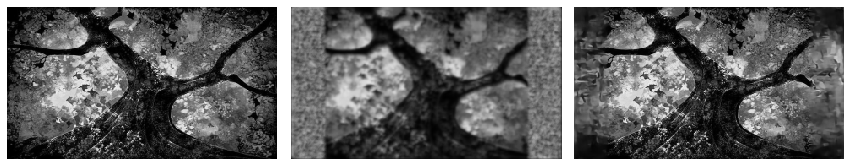

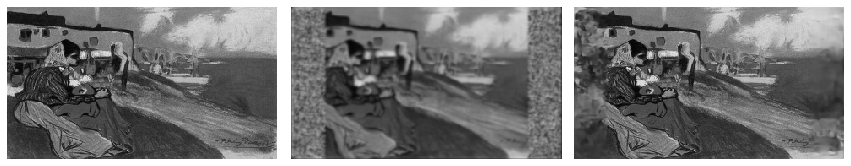

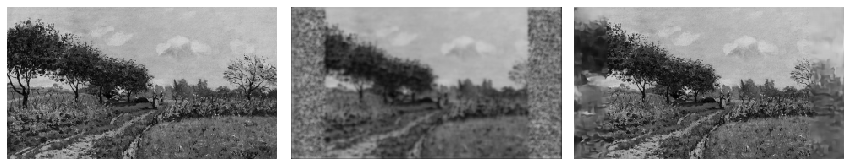

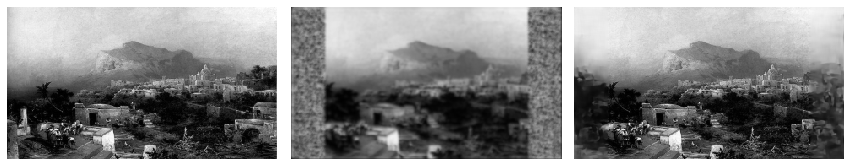

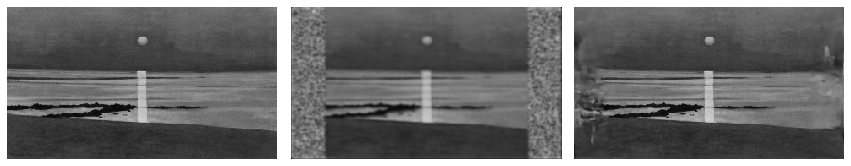

...

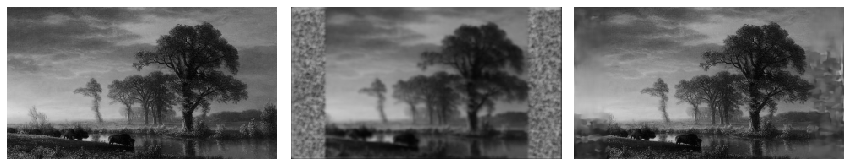

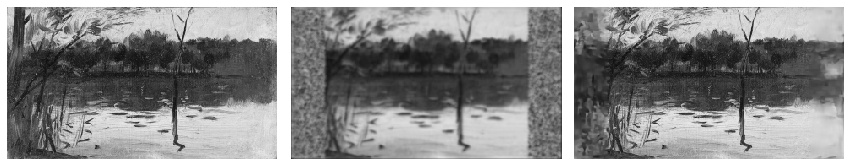

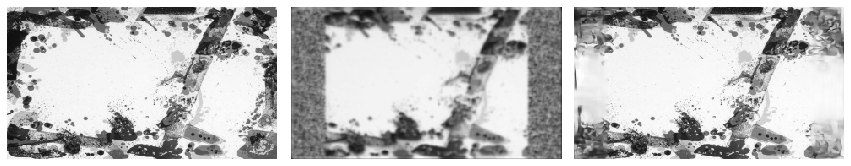

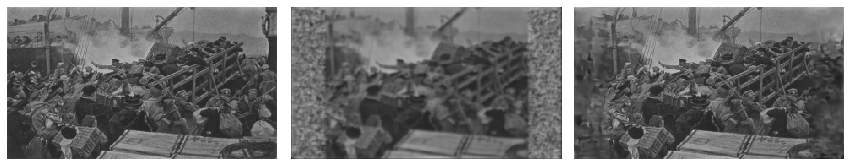

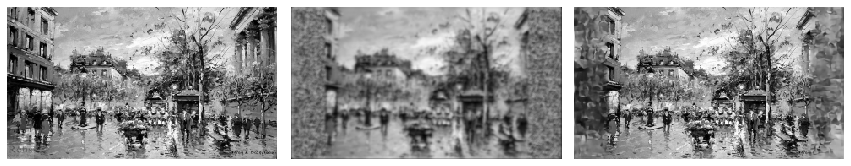

In [52]:
show_small_test_examples(output_y_array, l1_predictions, gan_predictions, len(testing_paths))

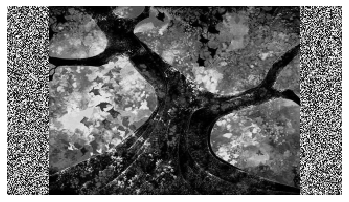

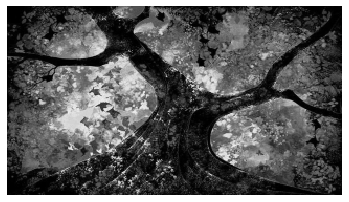

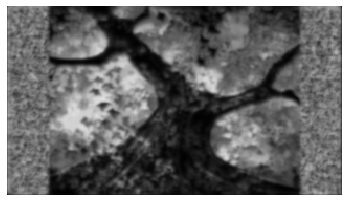

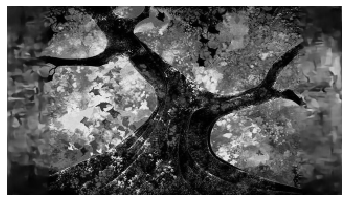

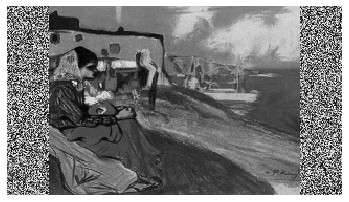

...

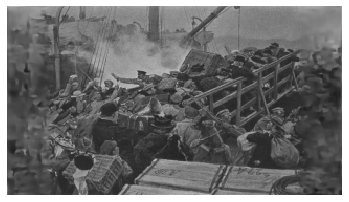

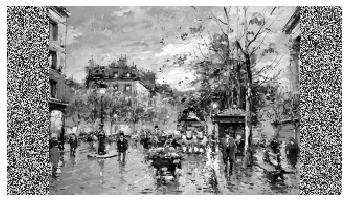

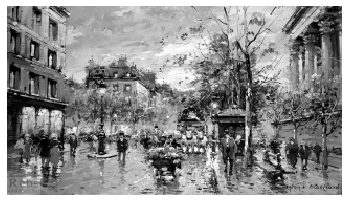

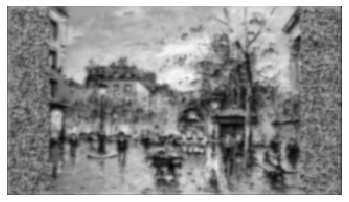

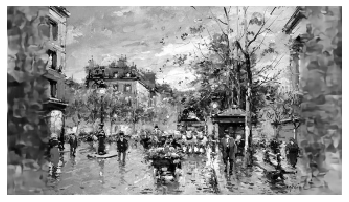

In [35]:
show_test_examples(testing_X, output_y_array, l1_predictions, gan_predictions, len(testing_paths))